In [32]:
import random
import numpy as np
from matplotlib import pyplot as plt

In [33]:
random.seed(10)

In [34]:
class Neuron:
    def __init__(self, id, connected_neurons=None):
        self.__id = id
        self.__output = float(0)
        self.__delta = float(0)
        self.__weight = random.uniform(-0.8, 0.8)

        if connected_neurons is None:
            connected_neurons = []
        self.__connections = {}
        for n in connected_neurons:
            self.__connections[n] = random.uniform(-1.0, 1.0)

    @property
    def output(self):
        return self.__output

    @output.setter
    def output(self, output):
        self.__output = output

    @property
    def delta(self):
        return self.__delta

    @delta.setter
    def delta(self, delta):
        self.__delta = delta

    @property
    def connections(self):
        return self.__connections

    @connections.setter
    def connections(self, connections):
        self.__connections = connections

    @property
    def weight(self):
        return self.__weight

    @weight.setter
    def weight(self, weight):
        self.__weight = weight

    def __hash__(self):
        return hash(self.__id)

In [35]:
import math
import random

class Sigmoid:
    def __init__(self, a):
        self.a = a

    def apply(self, x: float):
        return 1 / (1 + math.exp((-x) * self.a))

    def apply_derivative(self, x: float):
        temp = self.apply(x)
        return self.a * temp * (1 - temp)
    
    def approximation_r(self, x: float, h = 0.01):
        E_w = self.apply(x)
        E_w_r = self.apply(x + h)
        
        result = (E_w_r - E_w) / h
        
        return result
    
    def approximation_c(self, x: float, h = 0.01):
        E_w_r = self.apply(x + h)
        E_w_l = self.apply(x - h)
        
        result = (E_w_r - E_w_l) / (2*h)
        
        return result

In [36]:
class Layer:
    def __init__(self, neurons: [Neuron]):
        self.__neurons = neurons

    @property
    def neurons(self):
        return self.__neurons

    @neurons.setter
    def neurons(self, neurons):
        self.__neurons = neurons


class ActiveLayer(Layer):
    def __init__(self, neurons: [Neuron], a=0.1):
        super(ActiveLayer, self).__init__(neurons)
        self.__activation_func = Sigmoid(a)

    def apply_func(self, x):
        return self.__activation_func.apply(x)

    def apply_derivative_func(self, neuron, type_der = 'back'):
        if type_der == 'back':
            return self.__activation_func.apply_derivative(neuron.output)
        if type_der == 'right':
            return self.__activation_func.approximation_r(neuron.output)
        if type_der == 'center':
            return self.__activation_func.approximation_c(neuron.output)

In [37]:
class Perceptron:
    def __init__(self,
                 layers_params=None,
                 rate=0.1,
                 batch_size=50,
                 epoch_count=10,
                 a=1,
                 der_type = 'back'):
        if layers_params is None:
            layers_params = [1, 1]

        self.__rate = rate
        self.__batch_size = batch_size
        self.__epoch_count = epoch_count
        self.__a = a
        self.__layers_params = layers_params

        self.__train_avg_error = 0
        self.__res = []
        self.__create_layers(layers_params)
        
        self.__der_type = der_type

    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

    def __create_layers(self, layers_params):
        n_seq = 0
        input_neuron = Neuron(n_seq)
        layers = [Layer([input_neuron])]
        n_seq += 1

        prev_neurons = [input_neuron]
        neurons = []

        for p in layers_params:
            for j in range(p):
                neurons.append(Neuron(n_seq, prev_neurons))
                n_seq += 1
            layers.append(ActiveLayer(neurons, a=self.__a))
            prev_neurons = neurons
            neurons = []

        layers.append(ActiveLayer([Neuron(n_seq, prev_neurons)], a=self.__a))

        self.__layers = layers

    def fit(self, input_values: [[float]], output_values: [[float]]):
        for i in range(self.__epoch_count):
            indices = random.sample(range(len(input_values)), self.__batch_size)

            error = 0
            for iv, ov in zip([input_values[i] for i in indices], [output_values[i] for i in indices]):
                e = self.__train_example(iv, ov)
                error += e
            self.__train_avg_error += error / self.__batch_size

        self.__train_avg_error /= self.__epoch_count

    def predict(self, input_values: [[float]]):
        self.__res = []
        for iv in input_values:
            self.__set_input_layer_values(iv)
            self.__forward_propagate()
            self.__res.append([n.output for n in self.__layers[len(self.__layers) - 1].neurons])
        return self.__res

    def __train_example(self, input_value: [float], output_value: [float]):
        self.__set_input_layer_values(input_value)
        self.__forward_propagate()
        self.__backward_propagate(output_value)
        return self.__calc_error(output_value)

    def __set_input_layer_values(self, input_value):
        __input_layer = self.__layers[0]
        for i in range(len(__input_layer.neurons)):
            __input_layer.neurons[i].output = input_value[i]

    def __forward_propagate(self):
        for i in range(1, len(self.__layers)):
            for n in self.__layers[i].neurons:
                output = n.weight

                for connected_neuron, v in n.connections.items():
                    output += connected_neuron.output * v

                if i == len(self.__layers) - 1:
                    n.output = output
                else:
                    n.output = self.__layers[i].apply_func(output)

        return

    def __backward_propagate(self, output_value: [float]):
        for i in reversed(range(1, len(self.__layers))):
            cur_layer = self.__layers[i]

            if i == len(self.__layers) - 1:
                for n, o in zip(cur_layer.neurons, output_value):
                    n.delta = (n.output - o)
            else:
                for n in cur_layer.neurons:
                    correction = 0
                    for pn in self.__layers[i + 1].neurons:
                        correction += pn.delta * pn.connections[n]
                    n.delta = cur_layer.apply_derivative_func(n, self.__der_type) * correction

        for i in range(1, len(self.__layers)):
            cur_layer = self.__layers[i]
            for n in cur_layer.neurons:
                n.weight -= self.__rate * n.delta
                for connected_neuron, v in n.connections.items():
                    n.connections[connected_neuron] -= self.__rate * connected_neuron.output * n.delta

        return

    def __calc_error(self, output_value: [float]):
        res = 0
        for n, o in zip(self.__layers[len(self.__layers) - 1].neurons, output_value):
            res += (o - n.output) ** 2
        return res / 2

In [38]:
def get_func_value(func, x):
    if func == 'cos':
        return np.cos(2 * np.pi * x)
    if func == 'poly':
        return 5 * x ** 3 + x ** 2 + 5
    if func == 'sin':
        return x * np.sin(2 * np.pi * x)
    if func == 'x':
        return x

In [39]:
def get_normal_noised_func_value(f, x, mean=0, sd=1):
    f = get_func_value(f, x)
    noise = np.random.normal(mean, sd, f.shape)
    return f, f + noise

In [40]:
def get_layers_params():
    p_1 = []
    for i in range(1, 4):
        p_1.append([i])

    p_2 = []
    for p in p_1:
        for i in range(1, 4):
            p_2.append([p[0], i])

    p__ = p_1 + p_2
    return p__

In [41]:
count = 100
x = np.linspace(0, 1, num=count)
x_parts = np.array_split(x, 5)

In [42]:
params = get_layers_params()
print("Testing set of hidden layers params:\n" + str(params))

Testing set of hidden layers params:
[[1], [2], [3], [1, 1], [1, 2], [1, 3], [2, 1], [2, 2], [2, 3], [3, 1], [3, 2], [3, 3]]


#### Полином

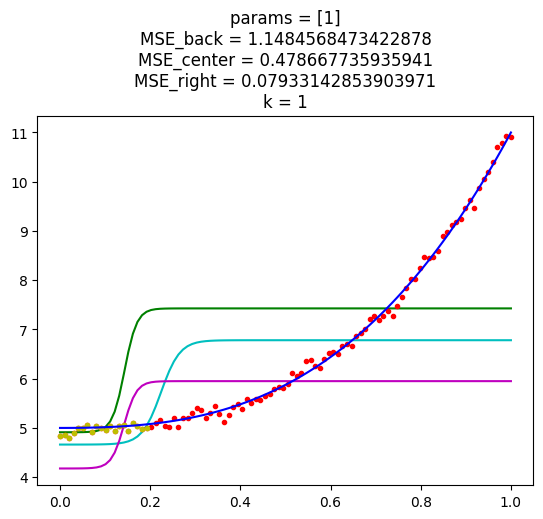

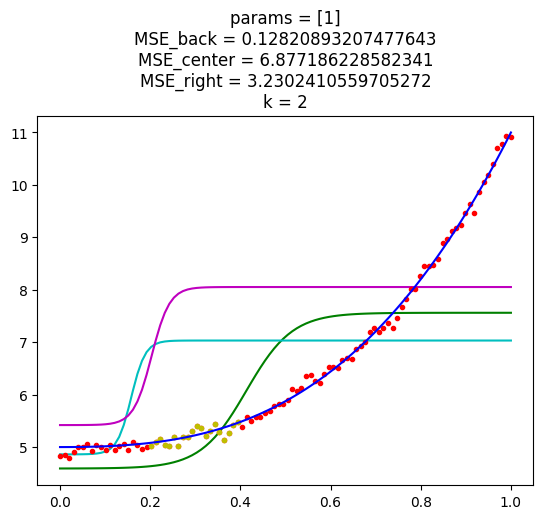

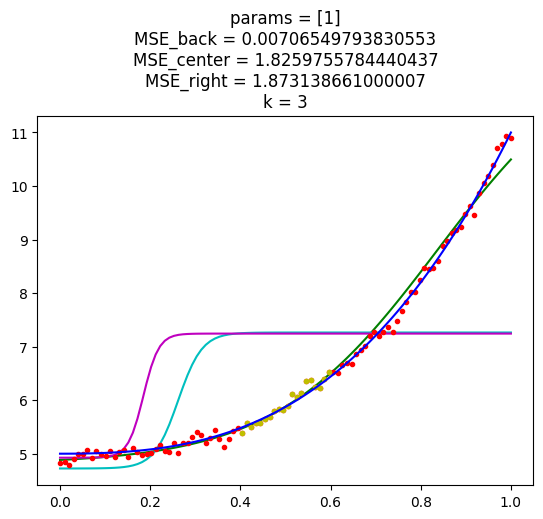

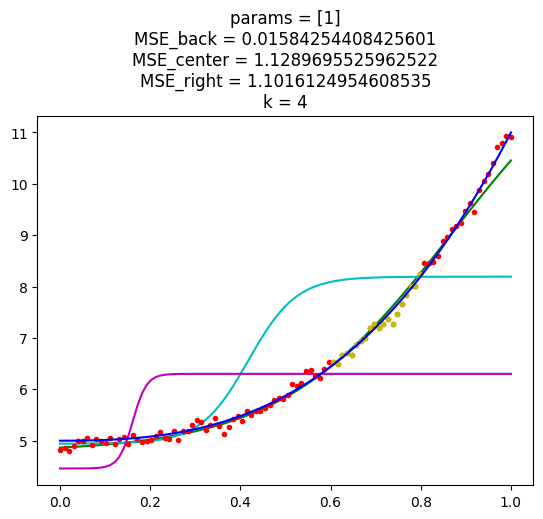

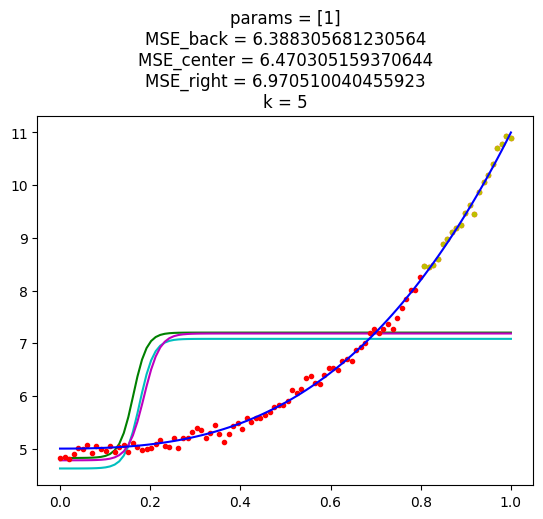

...

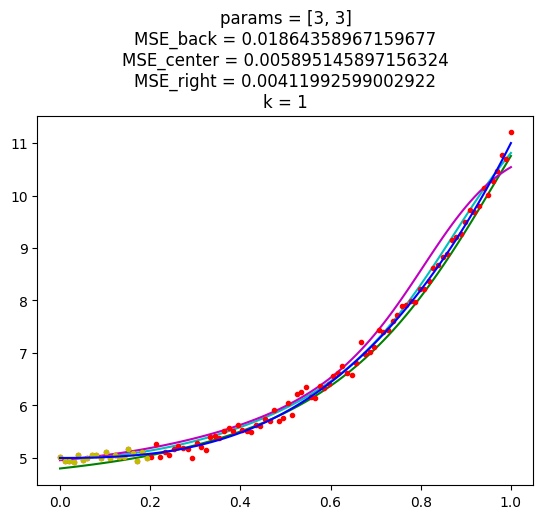

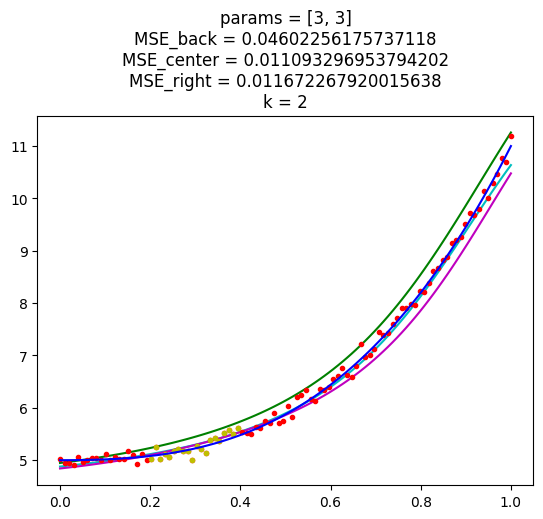

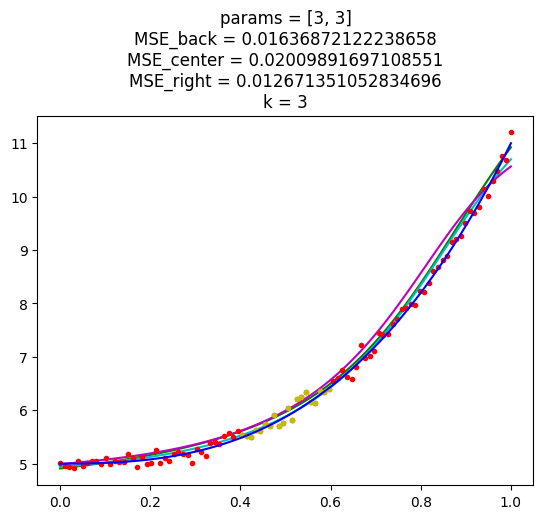

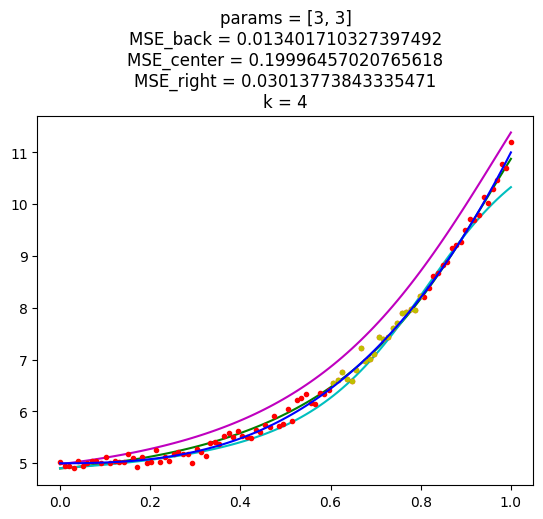

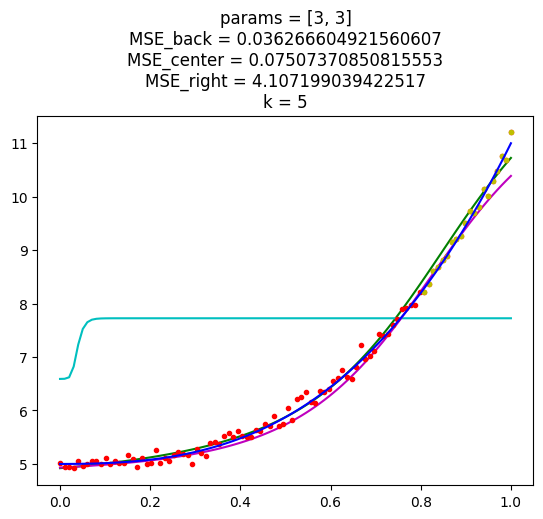

In [43]:
from sklearn.metrics import mean_squared_error

results = []

for param in params:
    avg_mean_squared_error_back = []
    avg_mean_squared_error_right = []
    avg_mean_squared_error_center = []
    
    y, y_noised = get_normal_noised_func_value('poly', x, 0, 0.1)
    y_noised_parts = np.array_split(y_noised, 5)
    
    for k in range(len(x_parts)):
        for der_type in ['back', 'right', 'center']:
            model = Perceptron(
                rate=0.1,
                layers_params=param,
                epoch_count=200,
                batch_size=20,
                der_type = der_type
            )
            
            model.fit([[v] for v in x], [[v] for v in y_noised])
            res = model.predict([[v] for v in x])
            y_pred = [[v][0] for v in res]
            y_pred_parts = np.array_split(y_pred, 5)
            
            if der_type == 'back':
                avg_mean_squared_error_back.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            if der_type == 'right':
                avg_mean_squared_error_right.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            if der_type == 'center':
                avg_mean_squared_error_center.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            
            if der_type == 'back':
                plt.plot(x, y_pred, 'g-')
            if der_type == 'right':
                plt.plot(x, y_pred, 'c-')
            if der_type == 'center':
                plt.plot(x, y_pred, 'm-')
                
        plt.title('params = ' + str(param) + '\n'
                + 'MSE_back = ' + str(avg_mean_squared_error_back[k])
                + '\n' + 'MSE_center = ' + str(avg_mean_squared_error_center[k])
                + '\n' + 'MSE_right = ' + str(avg_mean_squared_error_right[k])
                + '\n' + "k = " + str(k+1))
            
        plt.plot(x, y_noised, 'r.')
        plt.plot(x_parts[k], y_noised_parts[k], 'y.')
        plt.plot(x, y, 'b-')
        plt.show()
        
    results.append((param, np.average(avg_mean_squared_error_center), 'center'))
    results.append((param, np.average(avg_mean_squared_error_back), 'back'))
    results.append((param, np.average(avg_mean_squared_error_right), 'right'))

In [44]:
for t in (sorted(results, key=lambda t: t[1])):
    print('Layer Params = ', t[0], ' Error = ', t[1], ' Der type = ', t[2])

Layer Params =  [3, 2]  Error =  0.02022258131871231  Der type =  center
Layer Params =  [3, 2]  Error =  0.024832883170498386  Der type =  back
Layer Params =  [3, 3]  Error =  0.026140637580062527  Der type =  back
Layer Params =  [1, 2]  Error =  0.038299016195341824  Der type =  back
Layer Params =  [3, 3]  Error =  0.06242512770756955  Der type =  center
Layer Params =  [2, 2]  Error =  0.07311603316203379  Der type =  center
Layer Params =  [2, 1]  Error =  0.1151812407984701  Der type =  right
Layer Params =  [2]  Error =  0.12152866598678842  Der type =  back
Layer Params =  [2, 1]  Error =  0.1276247195189492  Der type =  back
Layer Params =  [3, 2]  Error =  0.1513335459719705  Der type =  right
Layer Params =  [2, 1]  Error =  0.1610591008513902  Der type =  center
Layer Params =  [2, 2]  Error =  0.1642303136671785  Der type =  back
Layer Params =  [3]  Error =  0.19717793590288954  Der type =  right
Layer Params =  [3, 1]  Error =  0.23707856829325982  Der type =  center
L

#### Синус

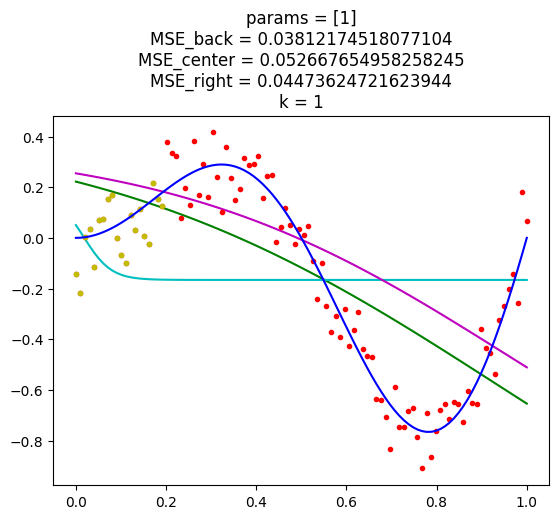

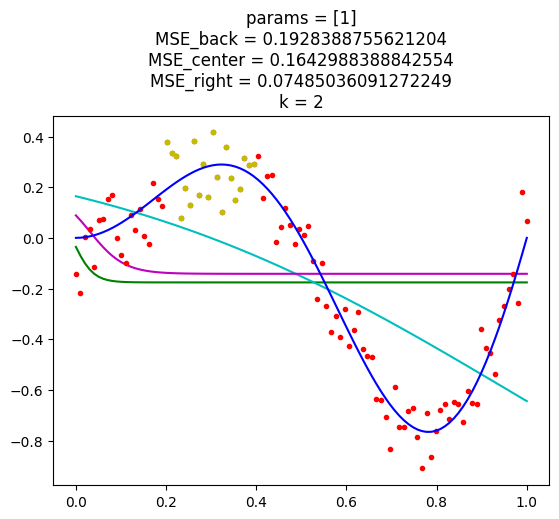

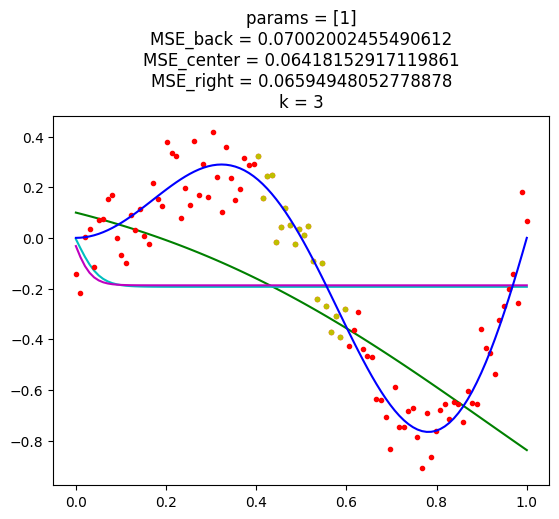

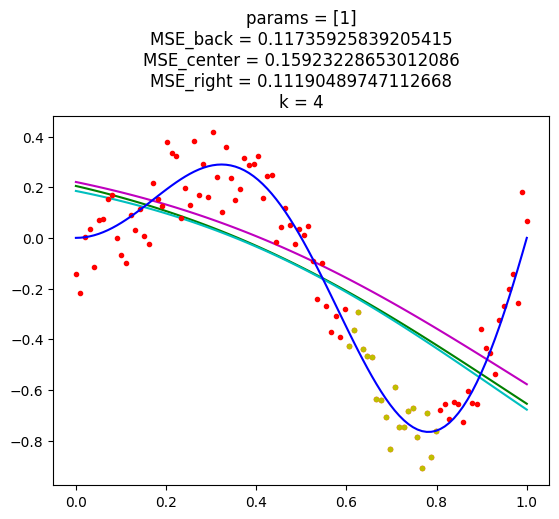

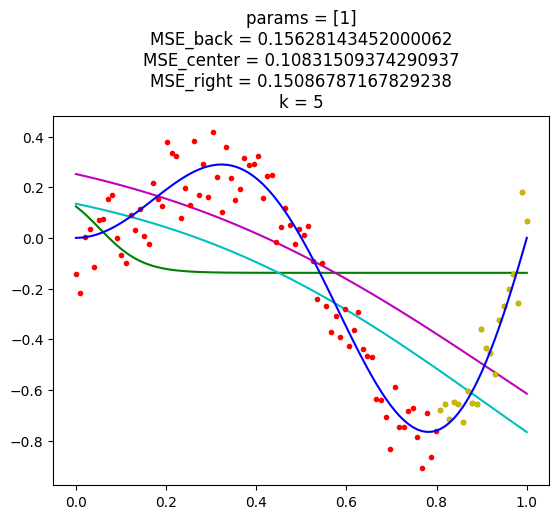

...

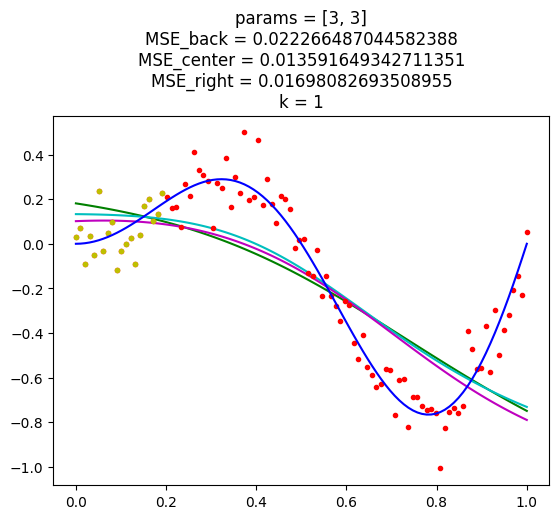

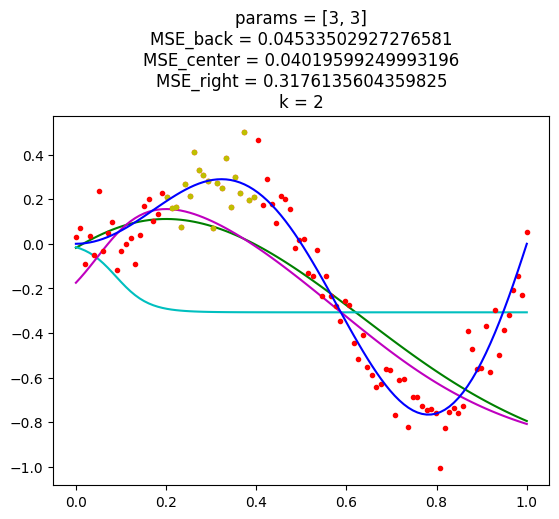

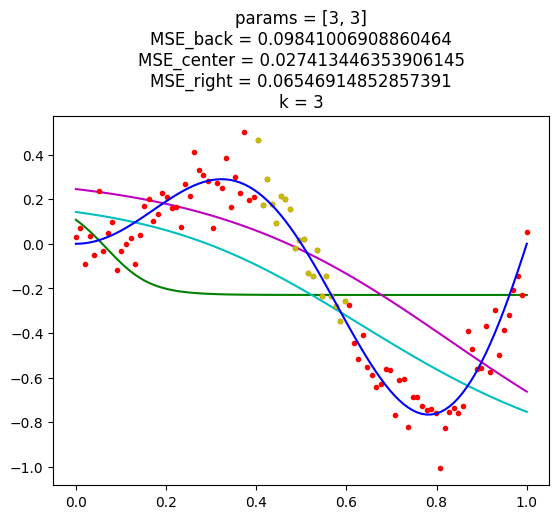

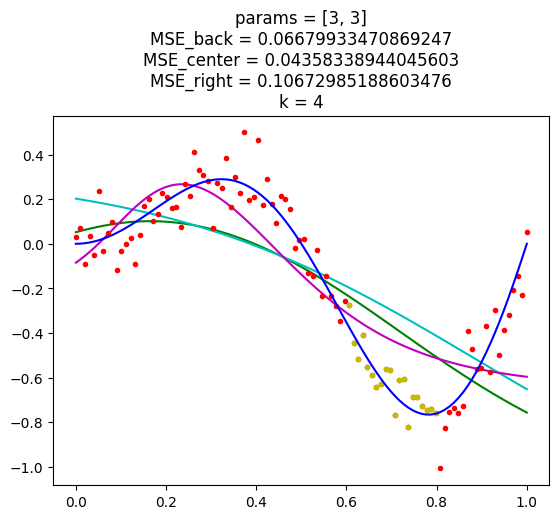

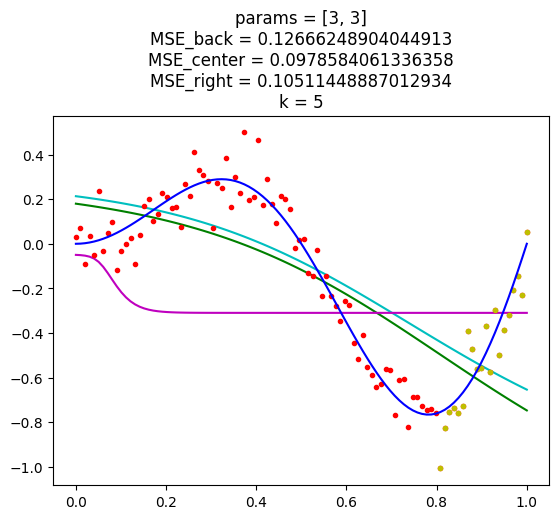

In [45]:
from sklearn.metrics import mean_squared_error

results = []

for param in params:
    avg_mean_squared_error_back = []
    avg_mean_squared_error_right = []
    avg_mean_squared_error_center = []
    
    y, y_noised = get_normal_noised_func_value('sin', x, 0, 0.1)
    y_noised_parts = np.array_split(y_noised, 5)
    
    for k in range(len(x_parts)):
        for der_type in ['back', 'right', 'center']:
            model = Perceptron(
                rate=0.1,
                layers_params=param,
                epoch_count=1000,
                batch_size=50,
                der_type = der_type
            )
            
            model.fit([[v] for v in x], [[v] for v in y_noised])
            res = model.predict([[v] for v in x])
            y_pred = [[v][0] for v in res]
            y_pred_parts = np.array_split(y_pred, 5)
            
            if der_type == 'back':
                avg_mean_squared_error_back.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            if der_type == 'right':
                avg_mean_squared_error_right.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            if der_type == 'center':
                avg_mean_squared_error_center.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            
            if der_type == 'back':
                plt.plot(x, y_pred, 'g-')
            if der_type == 'right':
                plt.plot(x, y_pred, 'c-')
            if der_type == 'center':
                plt.plot(x, y_pred, 'm-')
                
        plt.title('params = ' + str(param) + '\n'
                + 'MSE_back = ' + str(avg_mean_squared_error_back[k])
                + '\n' + 'MSE_center = ' + str(avg_mean_squared_error_center[k])
                + '\n' + 'MSE_right = ' + str(avg_mean_squared_error_right[k])
                + '\n' + "k = " + str(k+1))
            
        plt.plot(x, y_noised, 'r.')
        plt.plot(x_parts[k], y_noised_parts[k], 'y.')
        plt.plot(x, y, 'b-')
        plt.show()
        
    results.append((param, np.average(avg_mean_squared_error_center), 'center'))
    results.append((param, np.average(avg_mean_squared_error_back), 'back'))
    results.append((param, np.average(avg_mean_squared_error_right), 'right'))

In [46]:
for t in (sorted(results, key=lambda t: t[1])):
    print('Layer Params = ', t[0], ' Error = ', t[1], ' Der type = ', t[2])

Layer Params =  [3, 3]  Error =  0.04452857675412826  Der type =  center
Layer Params =  [2, 1]  Error =  0.05400906902146826  Der type =  back
Layer Params =  [2, 3]  Error =  0.055683955683432894  Der type =  right
Layer Params =  [3, 1]  Error =  0.06547446715645841  Der type =  back
Layer Params =  [3, 2]  Error =  0.0689025096862014  Der type =  right
Layer Params =  [2]  Error =  0.06918304489974317  Der type =  right
Layer Params =  [3, 1]  Error =  0.06961451634318347  Der type =  right
Layer Params =  [2, 3]  Error =  0.06989662515567334  Der type =  center
Layer Params =  [3, 3]  Error =  0.0718946818310189  Der type =  back
Layer Params =  [3, 2]  Error =  0.07635056061014893  Der type =  center
Layer Params =  [3]  Error =  0.07649578582280461  Der type =  right
Layer Params =  [1, 3]  Error =  0.07782782048861506  Der type =  back
Layer Params =  [3]  Error =  0.07842982510079297  Der type =  back
Layer Params =  [1, 1]  Error =  0.08009551999369906  Der type =  back
Layer

#### Косинус

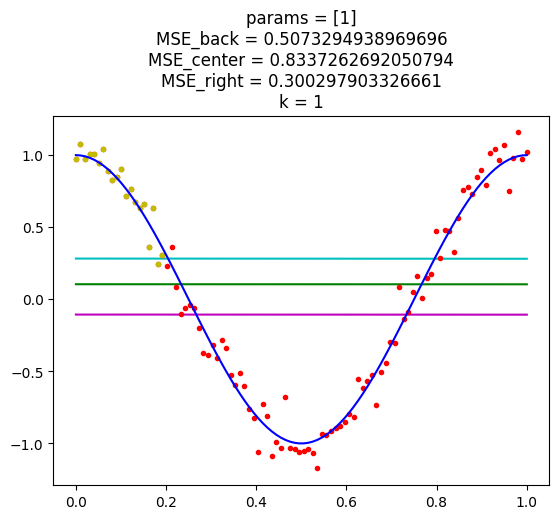

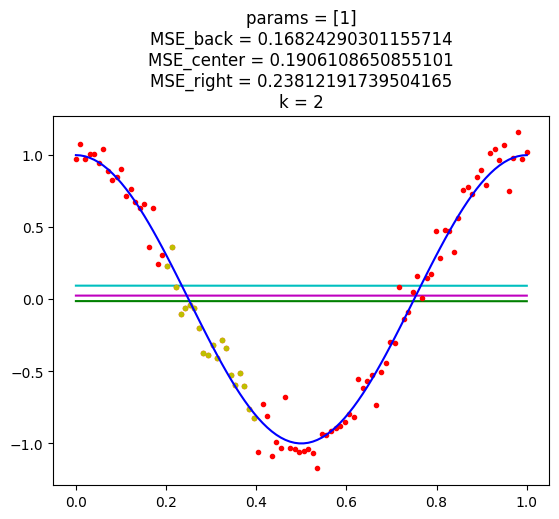

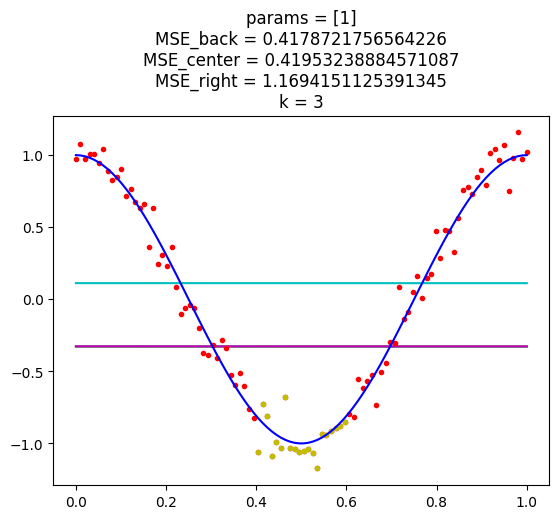

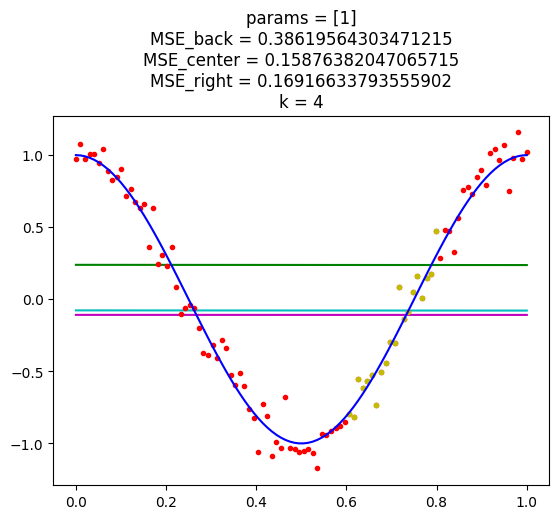

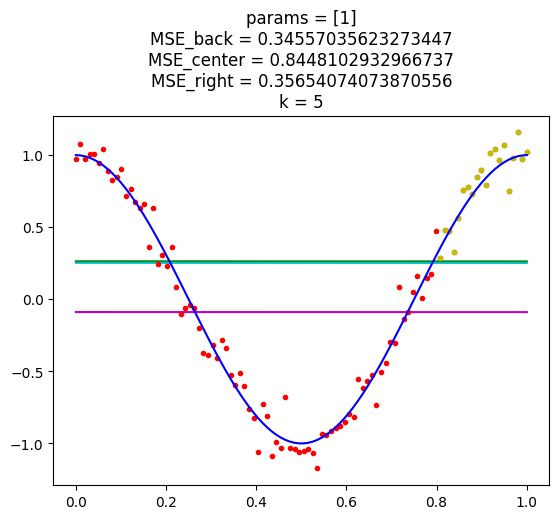

...

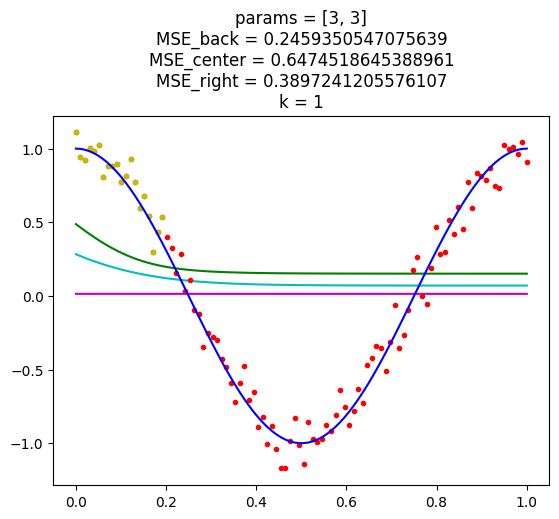

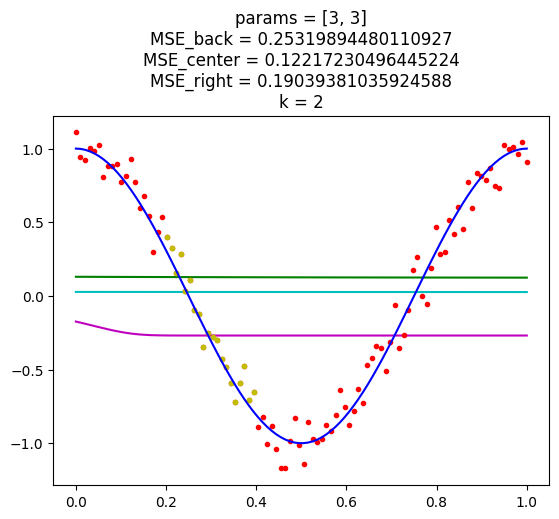

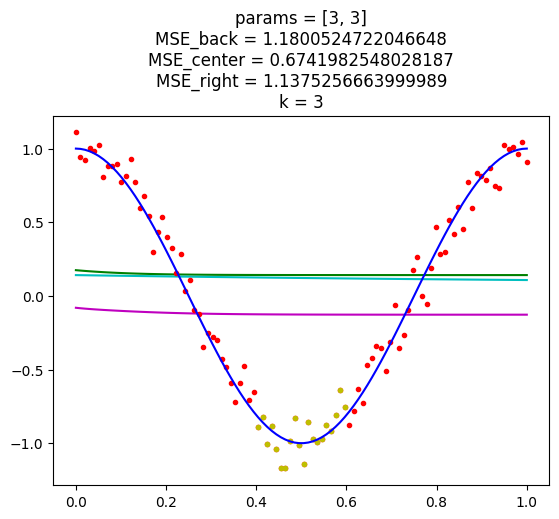

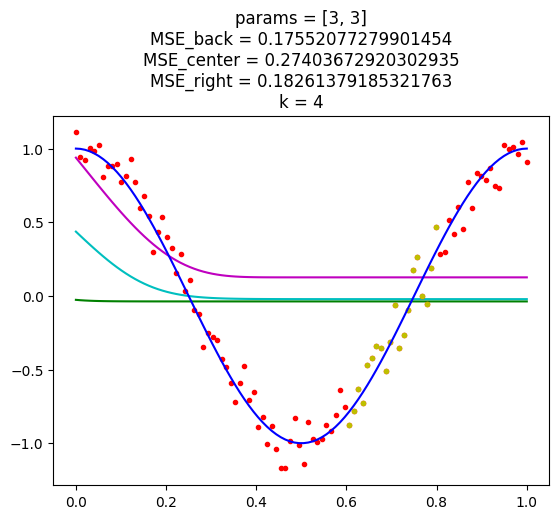

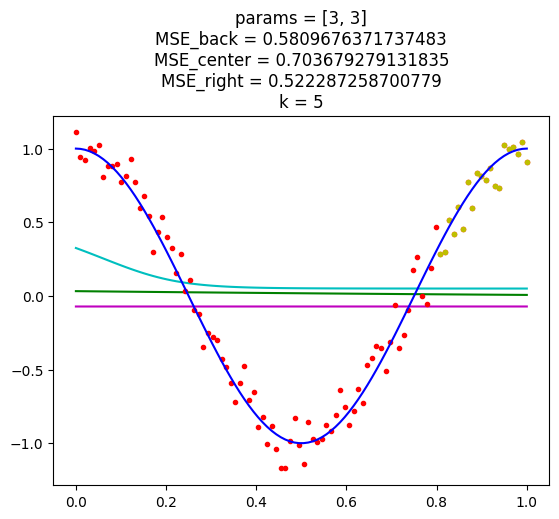

In [47]:
from sklearn.metrics import mean_squared_error

results = []

for param in params:
    avg_mean_squared_error_back = []
    avg_mean_squared_error_right = []
    avg_mean_squared_error_center = []
    
    y, y_noised = get_normal_noised_func_value('cos', x, 0, 0.1)
    y_noised_parts = np.array_split(y_noised, 5)
    
    for k in range(len(x_parts)):
        for der_type in ['back', 'right', 'center']:
            model = Perceptron(
                rate=0.1,
                layers_params=param,
                epoch_count=1000,
                batch_size=50,
                der_type = der_type
            )
            
            model.fit([[v] for v in x], [[v] for v in y_noised])
            res = model.predict([[v] for v in x])
            y_pred = [[v][0] for v in res]
            y_pred_parts = np.array_split(y_pred, 5)
            
            if der_type == 'back':
                avg_mean_squared_error_back.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            if der_type == 'right':
                avg_mean_squared_error_right.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            if der_type == 'center':
                avg_mean_squared_error_center.append(mean_squared_error(y_noised_parts[k], y_pred_parts[k]))
            
            if der_type == 'back':
                plt.plot(x, y_pred, 'g-')
            if der_type == 'right':
                plt.plot(x, y_pred, 'c-')
            if der_type == 'center':
                plt.plot(x, y_pred, 'm-')
                
        plt.title('params = ' + str(param) + '\n'
                + 'MSE_back = ' + str(avg_mean_squared_error_back[k])
                + '\n' + 'MSE_center = ' + str(avg_mean_squared_error_center[k])
                + '\n' + 'MSE_right = ' + str(avg_mean_squared_error_right[k])
                + '\n' + "k = " + str(k+1))
            
        plt.plot(x, y_noised, 'r.')
        plt.plot(x_parts[k], y_noised_parts[k], 'y.')
        plt.plot(x, y, 'b-')
        plt.show()
        
    results.append((param, np.average(avg_mean_squared_error_center), 'center'))
    results.append((param, np.average(avg_mean_squared_error_back), 'back'))
    results.append((param, np.average(avg_mean_squared_error_right), 'right'))

In [48]:
for t in (sorted(results, key=lambda t: t[1])):
    print('Layer Params = ', t[0], ' Error = ', t[1], ' Der type = ', t[2])

Layer Params =  [1]  Error =  0.36504211436647915  Der type =  back
Layer Params =  [2, 2]  Error =  0.3725694138590869  Der type =  center
Layer Params =  [1, 1]  Error =  0.41766938454420927  Der type =  back
Layer Params =  [2]  Error =  0.4394874510768947  Der type =  center
Layer Params =  [2]  Error =  0.44411849303211837  Der type =  back
Layer Params =  [1]  Error =  0.44670840238702036  Der type =  right
Layer Params =  [2]  Error =  0.44747371722528895  Der type =  right
Layer Params =  [3, 2]  Error =  0.4682788590111266  Der type =  right
Layer Params =  [1, 2]  Error =  0.4774107896148087  Der type =  right
Layer Params =  [2, 2]  Error =  0.4776985805371023  Der type =  back
Layer Params =  [3, 1]  Error =  0.48224783441599745  Der type =  back
Layer Params =  [2, 3]  Error =  0.483806861028107  Der type =  back
Layer Params =  [3, 3]  Error =  0.48430768652820627  Der type =  center
Layer Params =  [3, 3]  Error =  0.48450892957417036  Der type =  right
Layer Params =  [